In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
 !pip install -q git+https://github.com/tensorflow/docs

In [3]:
from tensorflow_docs.vis import embed
from tensorflow.keras import layers
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

In [ ]:
!pip install -q git+https://github.com/tensorflow/docs

In [5]:
#Define hyper parameters
MAX_SEQ_LENGTH = 50 # if number of frames is less than 50 fill with 0 that is call padding
NUM_FEATURES = 1024 # Number of features we want
IMG_SIZE = 512

EPOCHS = 200

In [6]:
os.listdir('/content/drive/MyDrive/Dataset/dataset_5')

['2', '8', '7', '3', '9', '5', '10', '6', '4', '1']

In [7]:
data_path = '/content/drive/MyDrive/Dataset/dataset_5'
tag = [] # for tag # or storing class name 
video_name = [] # for video name
for folder in os.listdir(data_path):
  for video in os.listdir(os.path.join(data_path, folder)):
    tag.append(folder)
    video_name.append(data_path + '/' + folder + '/' + video)
print(tag)
print(video_name)
# put in dataframe
df_train = pd.DataFrame({'tag': tag, 'video_name': video_name})
print(df_train.head()) # show some data from data frame

['2', '2', '8', '8', '7', '7', '3', '3', '9', '9', '5', '5', '10', '10', '6', '6', '4', '4', '1', '1']
['/content/drive/MyDrive/Dataset/dataset_5/2/350.avi', '/content/drive/MyDrive/Dataset/dataset_5/2/354.avi', '/content/drive/MyDrive/Dataset/dataset_5/8/350.avi', '/content/drive/MyDrive/Dataset/dataset_5/8/354.avi', '/content/drive/MyDrive/Dataset/dataset_5/7/350.avi', '/content/drive/MyDrive/Dataset/dataset_5/7/354.avi', '/content/drive/MyDrive/Dataset/dataset_5/3/350.avi', '/content/drive/MyDrive/Dataset/dataset_5/3/354.avi', '/content/drive/MyDrive/Dataset/dataset_5/9/350.avi', '/content/drive/MyDrive/Dataset/dataset_5/9/354.avi', '/content/drive/MyDrive/Dataset/dataset_5/5/350.avi', '/content/drive/MyDrive/Dataset/dataset_5/5/354.avi', '/content/drive/MyDrive/Dataset/dataset_5/10/350.avi', '/content/drive/MyDrive/Dataset/dataset_5/10/354.avi', '/content/drive/MyDrive/Dataset/dataset_5/6/350.avi', '/content/drive/MyDrive/Dataset/dataset_5/6/354.avi', '/content/drive/MyDrive/Datase

In [8]:
center_crop_layer = layers.CenterCrop(IMG_SIZE, IMG_SIZE)

def crop_center(frame): # crop the center square
    cropped = center_crop_layer(frame[None, ...])
    cropped = cropped.numpy().squeeze()
    return cropped
#'''this function to extract frame from each phase video output'''
def load_video(path, max_frames=500): # we are getting max 500 frames of each phases 
  
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            print(frame)
            frame = crop_center(frame) # crop to center
            frame = frame[:, :, [2, 1, 0]] # storing in frame
            frames.append(frame) # adding all frames in frames list

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
        print("frames",frames)
    return np.array(frames)

# Now we we have frames of each phases ( It means images of frames of each phases)
#Next step is to extract features using DenseNet121 ( Densly connected  Convolution nural network)
#https://keras.io/api/applications/densenet/ # pretrained model, Transfering model here

def build_feature_extractor():
    feature_extractor = keras.applications.DenseNet121(
        weights="imagenet", # trained on imagenet
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.densenet.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")


# Now intializing the this   parameter
feature_extractor = build_feature_extractor()


# This is label Encoding, As our class is has string values and machine learning do not deal with this.
# Label preprocessing with StringLookup.
label_processor = keras.layers.StringLookup(
    num_oov_indices=0, vocabulary=np.unique(os.listdir('/content/drive/MyDrive/Dataset/dataset_5')), mask_token=None
)
print(label_processor.get_vocabulary())
labels = df_train["tag"].values
labels= label_processor(labels[...,None]).numpy()

29084464/29084464 [==============================] - 0s 0us/step
['1', '10', '2', '3', '4', '5', '6', '7', '8', '9']


/usr/local/lib/python3.8/dist-packages/numpy/core/numeric.py:2446: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return bool(asarray(a1 == a2).all())


In [9]:
# from here wha we discussed like encoding, creatng frames and all that, i have created one functions and put all in this function 
# Putting all data together, like padding, add batch dimention
def prepare_all_videos(df):
    num_samples = len(df)
    video_paths = df["video_name"].values.tolist()
    labels = df["tag"].values
    labels = label_processor(labels[..., None]).numpy()

    # `frame_features` are what we will feed to our sequence model.
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # For each video.
    for idx, path in enumerate(video_paths):
        print(idx)
        # Gather all its frames and add a batch dimension.
        frames = load_video(path)
        print(frames)

        # Pad shorter videos.
        if len(frames) < MAX_SEQ_LENGTH:
            diff = MAX_SEQ_LENGTH - len(frames)
            padding = np.zeros((diff, IMG_SIZE, IMG_SIZE, 3))
            frames = np.concatenate((frames, padding))

        frames = frames[None, ...]

        # Initialize placeholder to store the features of the current video.
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                if np.mean(batch[j, :]) > 0.0:
                    temp_frame_features[i, j, :] = feature_extractor.predict(
                        batch[None, j, :]
                    )

                else:
                    temp_frame_features[i, j, :] = 0.0

        frame_features[idx,] = temp_frame_features.squeeze()

    return frame_features, labels

In [10]:
train_data, train_labels = prepare_all_videos(df_train)
test_data, test_labels = prepare_all_videos(df_train)
# print(train_labels.shape)
# print(test_labels.shape)
# print(f"Frame features in train set: {train_data.shape}")

Streaming output truncated to the last 5000 lines.

       [[76., 56., 47.],
        [76., 56., 47.],
        [76., 56., 47.],
        ...,
        [93., 77., 64.],
        [93., 77., 64.],
        [92., 76., 63.]],

       ...,

       [[86., 63., 50.],
        [86., 63., 50.],
        [86., 63., 50.],
        ...,
        [75., 56., 44.],
        [72., 56., 43.],
        [70., 54., 41.]],

       [[86., 63., 50.],
        [86., 63., 50.],
        [86., 63., 50.],
        ...,
        [73., 57., 44.],
        [71., 54., 44.],
        [69., 52., 42.]],

       [[85., 62., 49.],
        [85., 62., 49.],
        [85., 62., 49.],
        ...,
        [71., 55., 42.],
        [69., 52., 42.],
        [67., 50., 40.]]], dtype=float32), array([[[76., 54., 46.],
        [76., 54., 46.],
        [76., 54., 46.],
        ...,
        [97., 80., 70.],
        [97., 80., 72.],
        [97., 80., 72.]],

       [[75., 53., 45.],
        [75., 53., 45.],
        [75., 53., 45.],
        ...,
      

In [11]:
class PositionalEmbedding(layers.Layer):
    def __init__(self, sequence_length, output_dim, **kwargs):
        super().__init__(**kwargs)
        self.position_embeddings = layers.Embedding(
            input_dim=sequence_length, output_dim=output_dim
        )
        self.sequence_length = sequence_length
        self.output_dim = output_dim

    def call(self, inputs):
        # The inputs are of shape: `(batch_size, frames, num_features)`
        length = tf.shape(inputs)[1]
        positions = tf.range(start=0, limit=length, delta=1)
        embedded_positions = self.position_embeddings(positions)
        return inputs + embedded_positions

    def compute_mask(self, inputs, mask=None):
        mask = tf.reduce_any(tf.cast(inputs, "bool"), axis=-1)
        return mask

In [12]:
class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads
        self.attention = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.3
        )
        self.dense_proj = keras.Sequential(
            [layers.Dense(dense_dim, activation=tf.nn.gelu), layers.Dense(embed_dim),]
        )
        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()

    def call(self, inputs, mask=None):
        if mask is not None:
            mask = mask[:, tf.newaxis, :]

        attention_output = self.attention(inputs, inputs, attention_mask=mask)
        proj_input = self.layernorm_1(inputs + attention_output)
        proj_output = self.dense_proj(proj_input)
        return self.layernorm_2(proj_input + proj_output)

In [13]:
def get_compiled_model():
    sequence_length = MAX_SEQ_LENGTH
    embed_dim = NUM_FEATURES
    dense_dim = 20
    num_heads = 1
    classes = len(label_processor.get_vocabulary())

    inputs = keras.Input(shape=(None, None))
    x = PositionalEmbedding(
        sequence_length, embed_dim, name="frame_position_embedding"
    )(inputs)
    x = TransformerEncoder(embed_dim, dense_dim, num_heads, name="transformer_layer")(x)
    x = layers.GlobalMaxPooling1D()(x)
    x = layers.Dropout(0.1)(x)
    outputs = layers.Dense(classes, activation="softmax")(x)
    model = keras.Model(inputs, outputs)

    model.compile(
        optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )
    return model


def run_experiment():
    filepath = "/tmp/video_classifier"
    checkpoint = keras.callbacks.ModelCheckpoint(
        filepath, save_weights_only=True, save_best_only=True, verbose=1
    )

    model = get_compiled_model()
    history = model.fit(
        train_data,
        train_labels,
        validation_split=0.1,
        epochs=EPOCHS,
        callbacks=[checkpoint],
    )

    model.load_weights(filepath)
    _, accuracy = model.evaluate(test_data, test_labels)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")

    return model

In [14]:
trained_model = run_experiment()

Epoch 1/200
1/1 [==============================] - ETA: 0s - loss: 4.7571 - accuracy: 0.1667
Epoch 1: val_loss improved from inf to 10.30178, saving model to /tmp/video_classifier
1/1 [==============================] - 2s 2s/step - loss: 4.7571 - accuracy: 0.1667 - val_loss: 10.3018 - val_accuracy: 0.0000e+00
Epoch 2/200
1/1 [==============================] - ETA: 0s - loss: 5.2191 - accuracy: 0.1667
Epoch 2: val_loss did not improve from 10.30178
1/1 [==============================] - 0s 52ms/step - loss: 5.2191 - accuracy: 0.1667 - val_loss: 12.4140 - val_accuracy: 0.0000e+00
Epoch 3/200
1/1 [==============================] - ETA: 0s - loss: 7.8217 - accuracy: 0.2222
Epoch 3: val_loss did not improve from 10.30178
1/1 [==============================] - 0s 50ms/step - loss: 7.8217 - accuracy: 0.2222 - val_loss: 11.1696 - val_accuracy: 0.0000e+00
Epoch 4/200
1/1 [==============================] - ETA: 0s - loss: 7.4174 - accuracy: 0.1667
Epoch 4: val_loss improved from 10.30178 to 9.12

Streaming output truncated to the last 5000 lines.

       [[31., 39., 25.],
        [31., 39., 25.],
        [31., 39., 25.],
        ...,
        [39., 57., 40.],
        [39., 57., 40.],
        [39., 57., 40.]],

       [[33., 38., 32.],
        [33., 38., 32.],
        [32., 37., 31.],
        ...,
        [40., 58., 45.],
        [39., 57., 44.],
        [39., 57., 44.]],

       ...,

       [[22., 29., 22.],
        [22., 29., 22.],
        [22., 29., 22.],
        ...,
        [19., 31., 24.],
        [19., 31., 24.],
        [19., 31., 24.]],

       [[22., 29., 22.],
        [22., 29., 22.],
        [22., 29., 22.],
        ...,
        [19., 31., 24.],
        [19., 31., 24.],
        [19., 31., 24.]],

       [[22., 29., 22.],
        [22., 29., 22.],
        [22., 29., 22.],
        ...,
        [19., 31., 24.],
        [19., 31., 24.],
        [19., 31., 24.]]], dtype=float32), array([[[31., 39., 25.],
        [31., 39., 25.],
        [31., 39., 25.],
        ...,
      


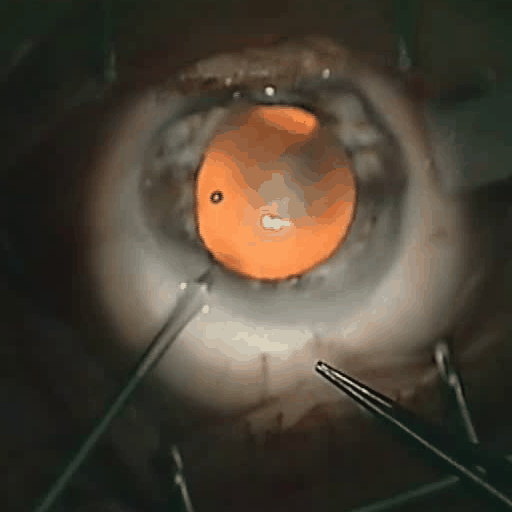

In [15]:
def prepare_single_video(frames):
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    # Pad shorter videos.
    if len(frames) < MAX_SEQ_LENGTH:
        diff = MAX_SEQ_LENGTH - len(frames)
        padding = np.zeros((diff, IMG_SIZE, IMG_SIZE, 3))
        frames = np.concatenate((frames, padding))

    frames = frames[None, ...]

    # Extract features from the frames of the current video.
    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            if np.mean(batch[j, :]) > 0.0:
                frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
            else:
                frame_features[i, j, :] = 0.0

    return frame_features


def predict_action(path):
    class_vocab = label_processor.get_vocabulary()

    frames = load_video(path)
    frame_features = prepare_single_video(frames)
    probabilities = trained_model.predict(frame_features)[0]
    predicted_class = np.argmax([probabilities], axis=1)[0]
    print("Current predicted phase is {} so next phase would be {}".format(str(predicted_class), str(predicted_class+1)))
    for i in np.argsort(probabilities)[::-1]:
        print(f"  {class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
    return frames


# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


test_video = '/content/drive/MyDrive/Dataset/dataset_5/1/350.avi'
print(f"Test video path: {test_video}")
test_frames = predict_action(test_video)
to_gif(test_frames[:MAX_SEQ_LENGTH])